# 2nd year computing Exercise 3 in Julia

In [132]:
import Pkg
using Pkg
Pkg.add("Distributions")
Pkg.add("Plots")
Pkg.add("LaTeXStrings")
Pkg.add("ProgressBars")
using Plots
using LaTeXStrings
import Distributions: Uniform
using ProgressBars
using Printf

   Resolving package versions...


  No Changes to `~/.julia/environments/v1.7/Project.toml`
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


   Resolving package versions...


  No Changes to `~/.julia/environments/v1.7/Project.toml`
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


   Resolving package versions...


  No Changes to `~/.julia/environments/v1.7/Project.toml`
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


   Resolving package versions...


  No Changes to `~/.julia/environments/v1.7/Project.toml`
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


## Part a) 
Write a Python program using the Euler method to calculate y(t) and vy (t) for a free falling body. You will need to provide sensible values for Cd, A and m. Use a starting height of 1 km and zero initial velocity. You will need to specify a condition for ending the simulation i.e. when the body reaches the ground. Plot your results.

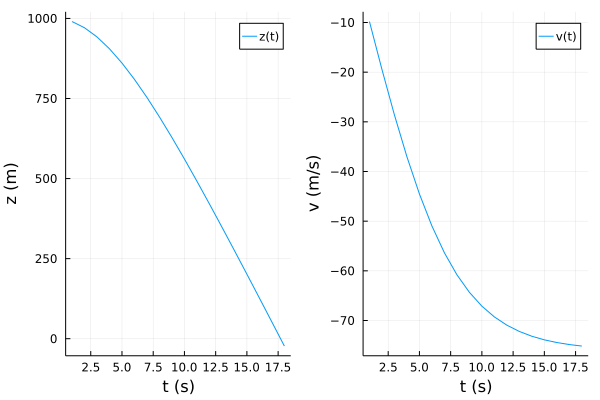

In [133]:
function FreeFall(z, j, Δt)

    v = 0
    t = 0

    V = Vector{Float64}()
    Z = Vector{Float64}()
    T = Vector{Float64}()

    while z >= 0
        v += -Δt * (g + j * abs(v) * v)
        z += Δt * v
        t += Δt
        append!(T, t)
        append!(Z, z)
        append!(V, v)
    end
    return T, Z, V
end

Cd = 1.1  # slightly lower than ski jumper (1.2-1.3) for free falling body
A = 0.18  # Head down position cross-sectional area
ρ0 = 1.2
g = 9.81

k = Cd * ρ0 * A / 2
m = 70

T, Z, V = FreeFall(1000, k / m, 1)

l = @layout [a b]
p1 = plot(T, Z, xlabel = "t (s)", ylabel = "z (m)", label = "z(t)")
p2 = plot(T, V, xlabel = "t (s)", ylabel = "v (m/s)", label = "v(t)")
plot(p1, p2, layout = l)

# Part b) 
Verify the correct functioning of your program by comparing with the following analytical prediction:  
$$
z = z_0 - \frac{m}{2k} \cdot ln\left[cosh^2\left(\sqrt{\frac{kg}{m}}\cdot t\right)\right] \\
v_z = -\sqrt{\frac{mg}{k}} \cdot tanh\left(\sqrt{\frac{kg}{m}} \cdot t \right)
$$
N.B. In these equations, you can set $y_0 = 1$ km and calculate $y$ and $v_y$ for any $t$. Examine the effect on your solution of varying the step size Δt. Investigate how closely your solution tracks the real trajectory for a range of step sizes. What happens to the simulation when Δt is very large? Explore the effect on the motion of varying the ratio k/m.

### Comparing initial computation with Δt = 1s to analytical solution

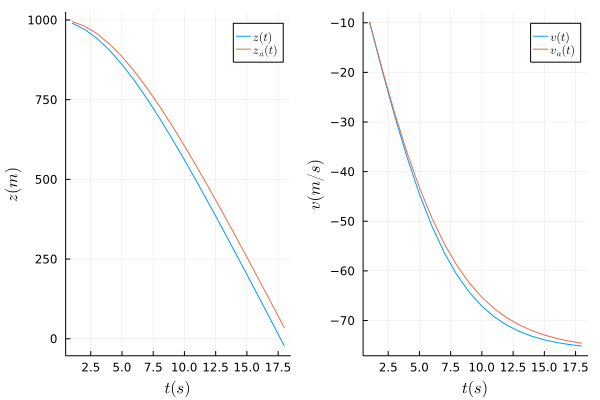

In [134]:
function FreeFallAn(z0, T, j)    
    zana = Vector{Float64}()
    vana = Vector{Float64}()
    for t in T
        append!(zana, z0 - 1/ (2 * j) * log((cosh(sqrt(j * g) * t))^2))
        append!(vana, -sqrt( g / j) * tanh(sqrt(j * g ) * t))
    end
    return zana, vana
end

zana, vana = FreeFallAn(1000, T, k/m)

l2 = @layout [a b]
p3 = plot(T, Z, xlabel = L"t (s)", ylabel = L"z (m)", label = L"z(t)")
plot!(T, zana, label = L"z_{a}(t)")
p4 = plot(T, V, xlabel = L"t (s)", ylabel = L"v (m/s)", label = L"v(t)")
plot!(T, vana, label = L"v_{a}(t)")
plot(p3, p4, layout = l)


### Investigating performance of numerical solution compared to analytical with varying Δt 

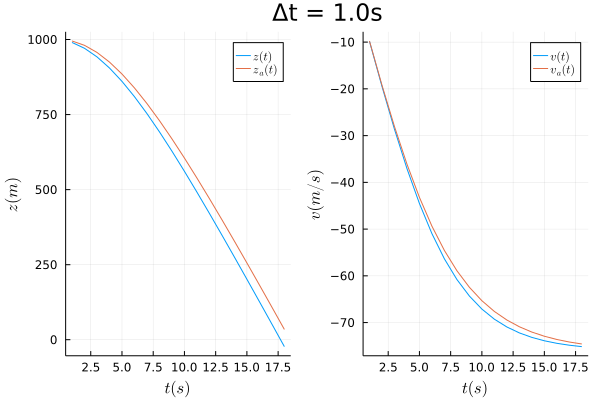

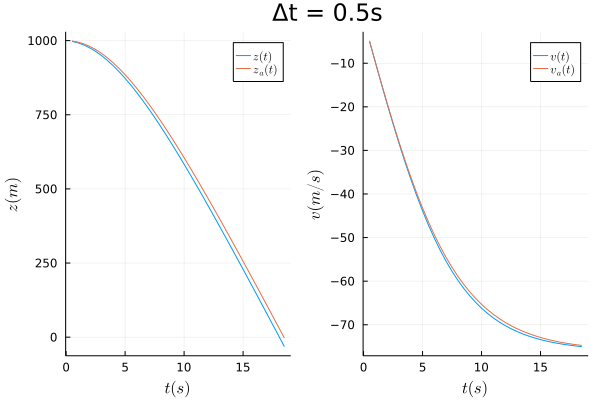

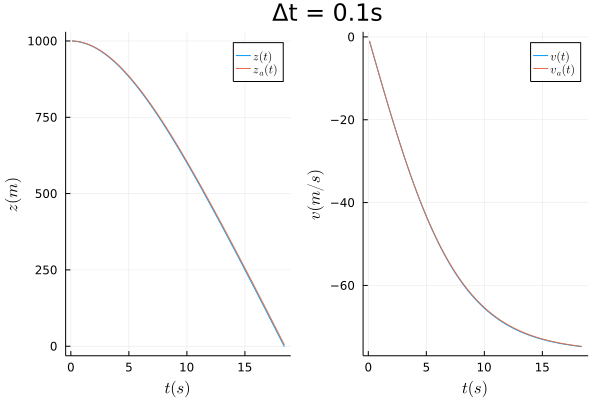

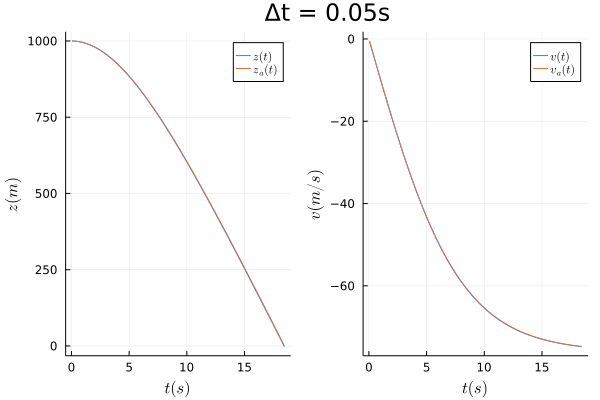

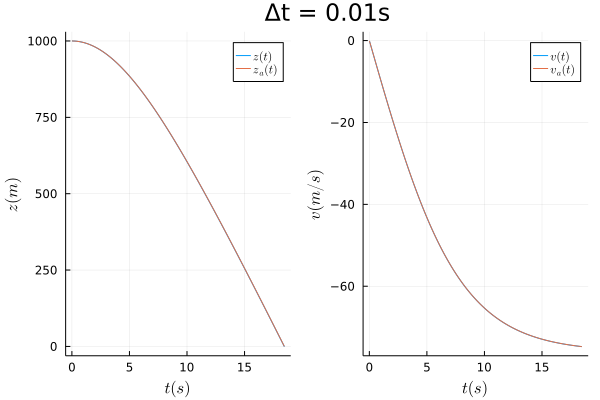

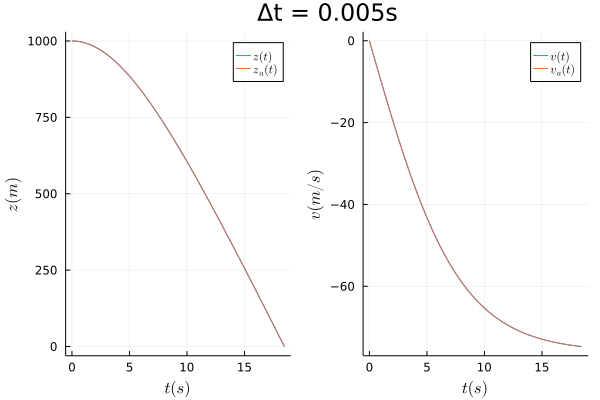

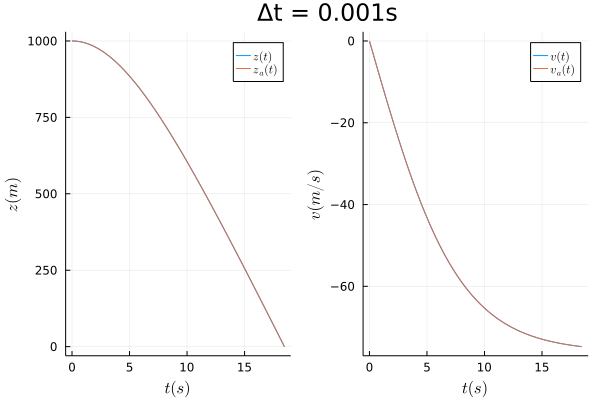

In [135]:
Δtarray = ([1,0.5,0.1,0.05,0.01,0.005,0.001])
for Δt in Δtarray
    
    T, Z, V = FreeFall(1000, k/m, Δt)
    zana, vana = FreeFallAn(1000,T, k/m)

    l3 = @layout [a b]
    p5 = plot(T, Z, xlabel = L"t (s)", ylabel = L"z (m)", label = L"z(t)")
    plot!(T, zana, label = L"z_{a}(t)")
    p6 = plot(T, V, xlabel = L"t (s)", ylabel = L"v (m/s)", label = L"v(t)")
    plot!(T, vana, label = L"v_{a}(t)")
    ptot = plot(p5, p6, layout = l3, plot_title = "Δt = $(Δt)s")
    display(ptot)
end

$\rightarrow$ Overall good performance below $\Delta t = 0.1$ s.

### What happens when $\Delta t$ is very large?

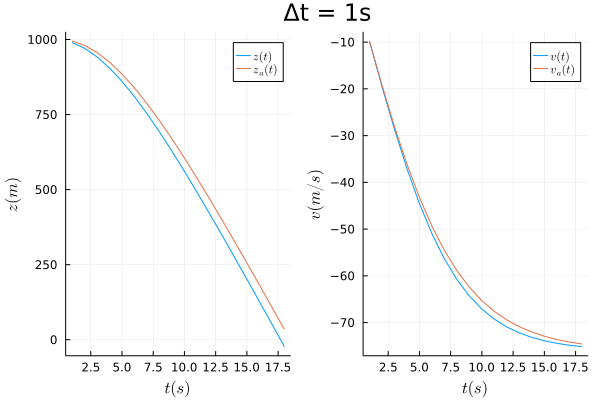

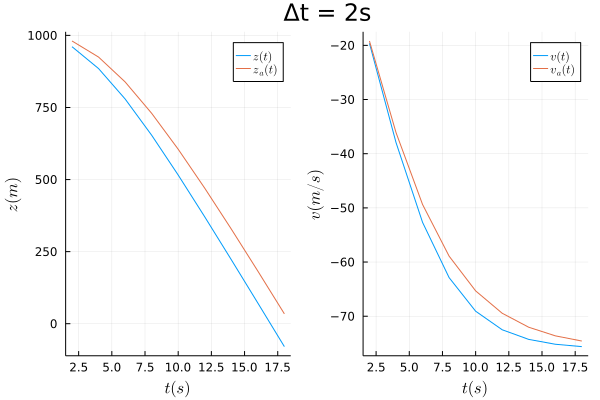

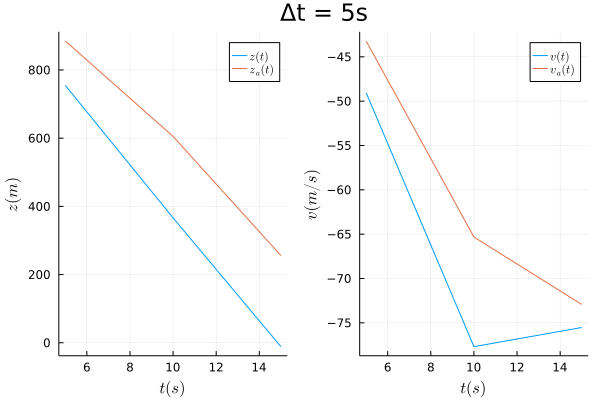

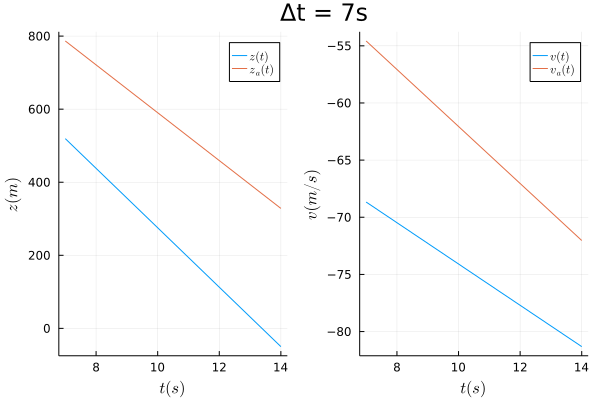

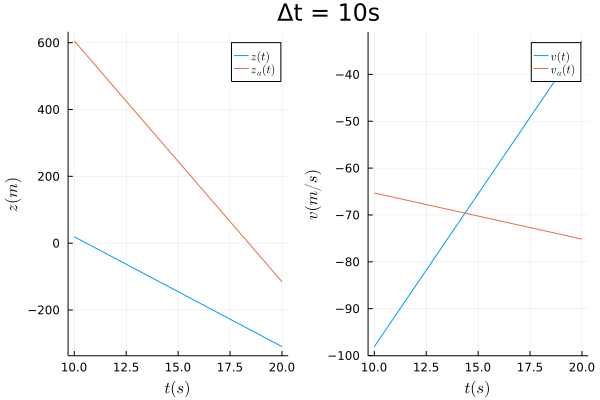

In [136]:
Δtarray = ([1,2,5,7,10])
for Δt in Δtarray

    T, Z, V = FreeFall(1000, k / m, Δt)
    zana, vana = FreeFallAn(1000, T, k/m)


    l3 = @layout [a b]
    p5 = plot(T, Z, xlabel = L"t (s)", ylabel = L"z (m)", label = L"z(t)")
    plot!(T, zana, label = L"z_{a}(t)")
    p6 = plot(T, V, xlabel = L"t (s)", ylabel = L"v (m/s)", label = L"v(t)")
    plot!(T, vana, label = L"v_{a}(t)")
    ptot = plot(p5, p6, layout = l3, plot_title = "Δt = $(Δt)s")
    display(ptot)
end

### Exploring the effect on motion of varying k/m ratio

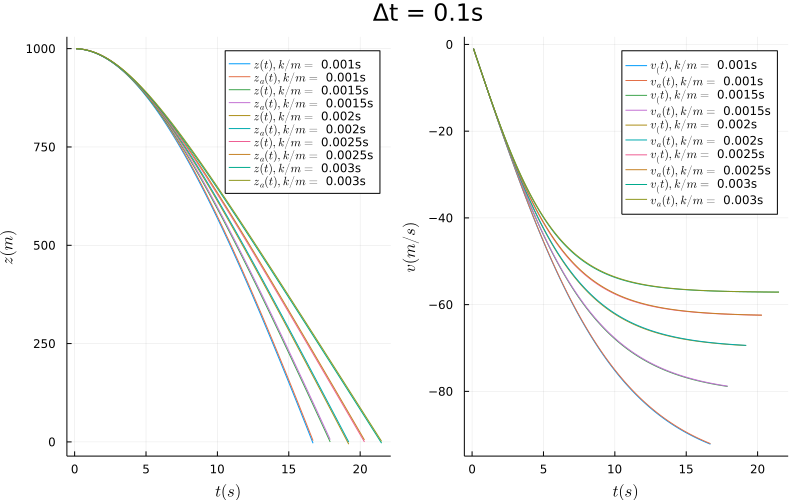

In [137]:
jlist = range(round(0.5 * k / m, digits = 3), round(2 * k / m, digits = 3), length = 5)
p1 = plot(xlabel = L"t (s)", ylabel = L"z (m)", plotsize = (1000, 400))
p2 = plot(xlabel = L"t (s)", ylabel = L"v (m/s)", plotsize = (1000, 400))
for j in jlist
    T, Z, V = FreeFall(1000, j, 0.1)
    zana, vana = FreeFallAn(1000, T, j)

    # l = @layout [a b]
    plot!(p1, T, Z, label = L"$z(t), k/m =$ %$(j)s")
    plot!(p1, T, zana, label = L"$z_a(t), k/m =$ %$(j)s")
    plot!(p2, T, V, label = L"$v_(t), k/m = $ %$(j)s")
    plot!(p2, T, vana, label = L"$v_{a}(t), k/m = $ %$(j)s")
end
l = @layout [a b]
ptot = plot(p1, p2, layout = l, plot_title = "Δt = 0.1s")
plot!(size = (800, 500))
display(ptot)

When k/m increases the duration of the fall increases too, and the downward speed reached is smaller

## Part c) 
Include an option to use the “modified Euler method” as outlined in the Lecture Notes. Compare the results
from the two methods for different values of t.

Simple Euler Method:
$$
z = z_0+ \Delta t f(t_0,z_0), ~~~ t = t_0 + \Delta t 
$$
Modified Euler Method:
$$
z = z_0+ \Delta t f(t_{mid},z_{mid}), ~~~ t = t_0 + \Delta t
$$
with 
$$
z_{mid} = z_0+ \frac{\Delta t}{2} f(t_{0},z_{0}), ~~~ t_{mid} = t_0 + \frac{\Delta t}{2}
$$

Now you are going to make the problem more realistic. Baumgartner jumped from very high altitude, where the air density is very low, and so the drag factor, $k$ should be replaced with a function $k(y)$. The simplest way to approach this is to make use of the scale height for the atmosphere, $h$, and model the variation of density as an exponential decay:
$$
\rho(y) = \rho_0 e^{-z/h}
$$
from which $k(y)$ follows using Eq. (1). An appropriate value of $h$ appears to be 7.64km (see
http://en.wikipedia.org/wiki/Scale_height).

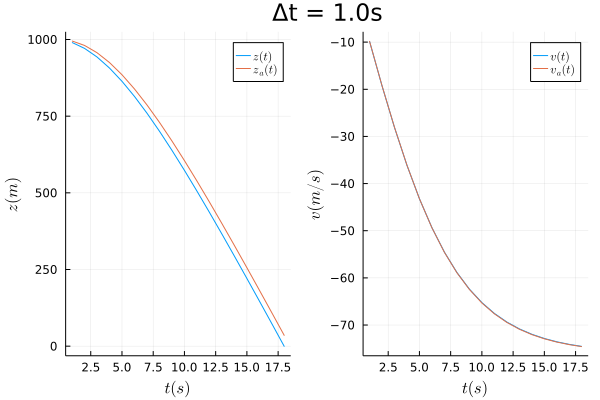

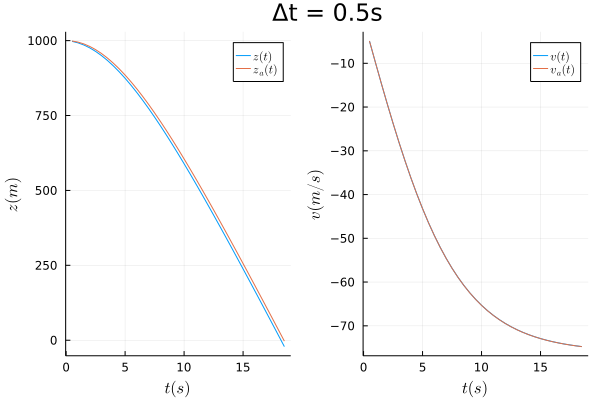

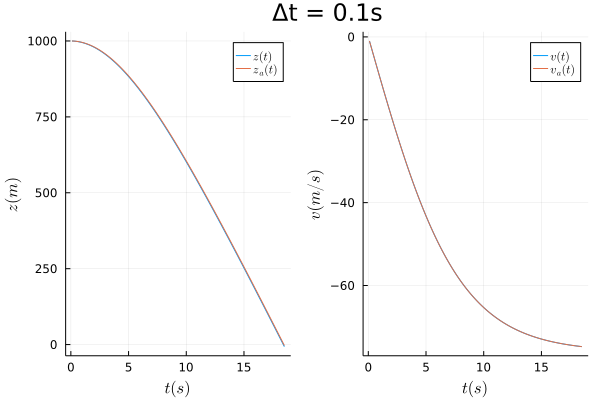

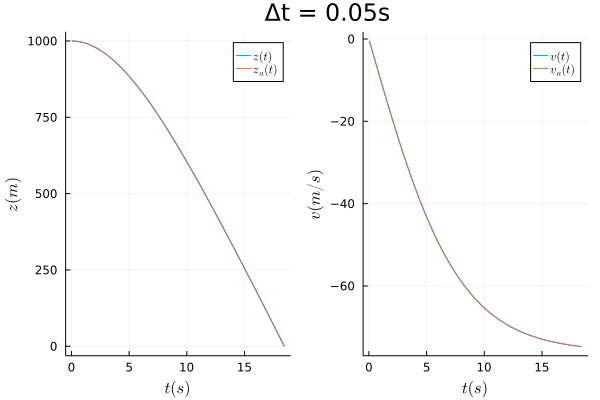

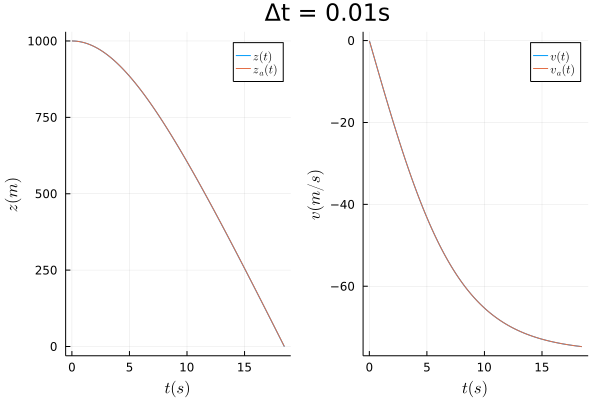

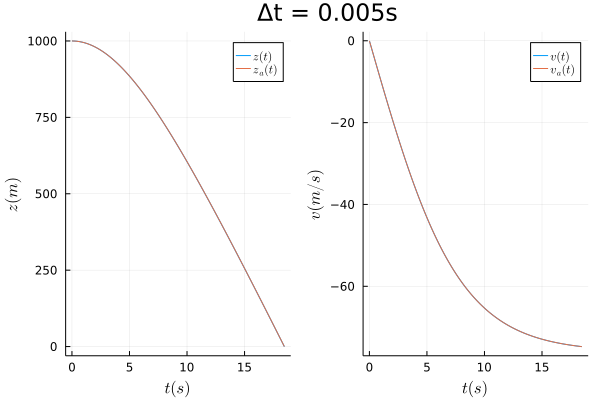

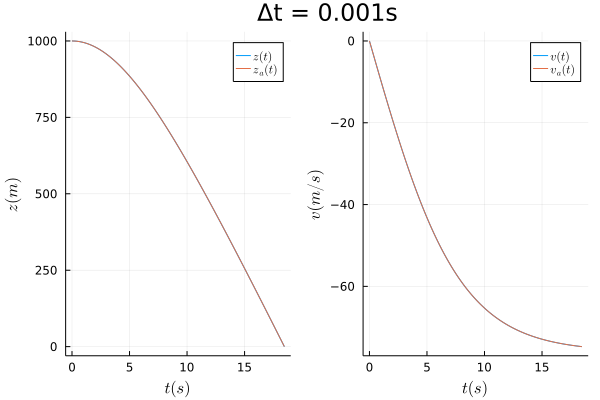

In [138]:
h = 7.64e3
function FFMod(z, j, Δt)
    v = 0
    t = 0

    V = Vector{Float64}()
    Z = Vector{Float64}()
    T = Vector{Float64}()

    while z >= 0
        vmid = v - (Δt / 2) * (g + j * abs(v) * v)
        t += Δt
        v += -Δt * (g + j * abs(vmid) * vmid)
        z += Δt * v
        append!(T, t)
        append!(Z, z)
        append!(V, v)
    end
    return T, Z, V
end

Δtarray = ([1, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001])

for Δt in Δtarray
    T, Z, V = FFMod(1000, k / m, Δt)
    zana, vana = FreeFallAn(1000, T, k / m)

    l3 = @layout [a b]
    p5 = plot(T, Z, xlabel = L"t (s)", ylabel = L"z (m)", label = L"z(t)")
    plot!(T, zana, label = L"z_{a}(t)")
    p6 = plot(T, V, xlabel = L"t (s)", ylabel = L"v (m/s)", label = L"v(t)")
    plot!(T, vana, label = L"v_{a}(t)")
    ptot = plot(p5, p6, layout = l3, plot_title = "Δt = $(Δt)s")
    display(ptot)
end


## Part d)
Adapt your program to use $\rho (y)$ instead of $\rho_0$. Test your program using the parameters for Baumgartner’s jump. Plot $z(t)$ and $v_z(t)$ against time. The most interesting feature of the motion is that the downwards speed goes through a maximum that is much greater than the terminal velocities predicted for constant $\rho$. Do you observe this? There was great interest in whether Baumgartner would break the sound barrier during this stage of his
jump. According to your simulation, does he manage it?

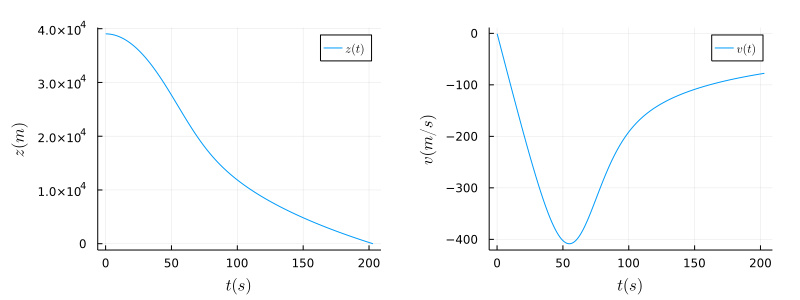

In [141]:
h = 7.64e3
function FFMod2(z, Δt)
    v = 0
    t = 0

    V = Vector{Float64}()
    Z = Vector{Float64}()
    T = Vector{Float64}()

    while z >= 0
        k = Cd * ρ0 * exp(-z / h) * A / 2
        j = k / m
        vmid = v - (Δt / 2) * (g + j * abs(v) * v)
        t += Δt
        v += -Δt * (g + j * abs(vmid) * vmid)
        z += Δt * v
        append!(T, t)
        append!(Z, z)
        append!(V, v)
    end
    return T, Z, V
end

T, Z, V = FFMod2(39045, 0.1)

l = @layout [a b]
p1 = plot(T, Z, xlabel = L"t (s)", ylabel = L"z (m)", label = L"z(t)")
p2 = plot(T, V, xlabel = L"t (s)", ylabel = L"v (m/s)", label = L"v(t)")
ptot = plot(p1, p2, layout = l)
plot!(size = (800, 300), margin = 5Plots.mm)
display(ptot)

## Part e)
Investigate the effect of varying the jump parameters on the maximum speed achieved, and the total duration of the jump. You should consider varying the jump height and the quantity $C_d A/m$.